In [1]:
import numpy as np
import os, sys, json
import PIL
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
from ast import literal_eval
import warnings
warnings.filterwarnings('ignore')

img_dir = '../../../rf-chess-data/roboflow/export/'
img_fns = os.listdir(img_dir)
crop_dir = '../../../rf-chess-data/cropped_verify/'

!ls ../../../rf-chess-data/roboflow/export/*.json

../../../rf-chess-data/roboflow/export/_annotations.coco.json
../../../rf-chess-data/roboflow/export/_annotations_v2.coco.json


In [2]:
annotate_fn = '_annotations_v2.coco.json'

with open(Path(img_dir, annotate_fn), 'r') as f:
    d_annotate = json.load(f)
    
df_annotate = pd.DataFrame(d_annotate['annotations'])
df_images = pd.DataFrame(d_annotate['images'])
df_categories = pd.DataFrame(d_annotate['categories'])

df = pd.read_csv('../data/rf-annotate/data_v1.1.csv')
df['bbox'] = df['bbox'].map(lambda x: literal_eval(x))

In [6]:
bq = df[df['category_full_name'] == 'black-queen']

corners = bq['bbox'].map(lambda x: (x[0], x[1])).tolist()
thresh = 10

def dist(a,b):
    return ((a[0] - b[0])**2 + (a[1] - b[1])**2)**0.5

twins = [ [ i2 for i2, c2 in enumerate(corners) 
                  if (i2 != i1) and (dist(c1, c2) < thresh)] 
              for i1, c1 in enumerate(corners)]

def sorter(i,v):
    x = list(set([i] + v))
    x.sort()
    return x

twin_sets = [sorter(i,v) for i,v in enumerate(twins)]

bq['twin_sets'] = twin_sets
bq['twin_sets_obj'] = bq['twin_sets'].map(str)

In [7]:
def make_set(s1, s2):
    
    shared_1 = [e for e in s1 if e in s2]
    
    if len(shared_1) < 0.5 * len(s1):
        return s1
    
    ret = list(set(s1).union(s2))
    ret.sort()
    return ret

def big_set(*args):
    ret = [(len(e), e) for e in args]
    ret.sort(reverse=True, key=lambda x: x[0])
    return ret[0][1]

list_ts = bq['twin_sets'].tolist()
out = list_ts.copy()
for _ in range(10):
    out = [ big_set(*[make_set(ts1, ts2) for ts2 in out]) for ts1 in out]

In [8]:
show = out.copy()
show.sort(key=lambda x: len(x) + 0.0001*x[0], reverse=True)
show

[[7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70,

In [10]:
bq['twin_set_cluster'] = out
bq['twin_set_cluster_obj'] = bq['twin_set_cluster'].map(str)

amts = bq.groupby('twin_set_cluster_obj').agg('count').iloc[:,1]

[7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83]
[2, 18, 29, 37, 38, 46, 48, 57, 59, 66, 67, 72, 73, 78]
[5, 6, 16, 20, 30, 32, 33, 39, 47, 60, 69, 86]
[1, 4, 8, 10, 22, 43, 44, 53, 65, 68, 75, 84]
[9, 17, 19, 35, 55, 71, 85]
[3, 24, 26]
[45, 58]
[42, 49]
[27, 74]


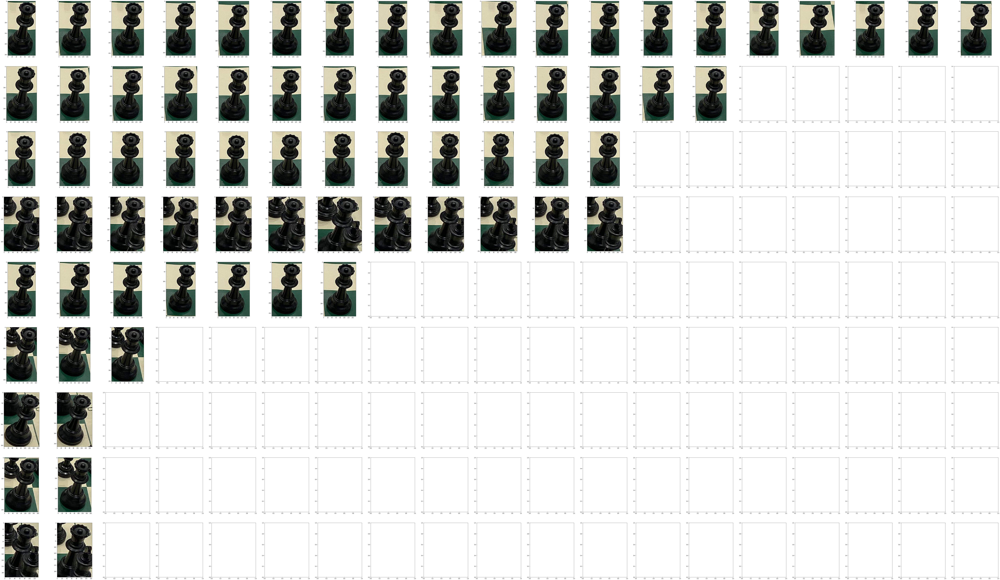

In [11]:
max_show = 99

matched = amts[amts > 1]
iters = matched.sort_values(ascending=False).index[:max_show]

cols = max([e.count(',') + 1 for e in iters])
rows = len(iters)

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(8 * cols, 10 * rows));

for irow, twin_code in enumerate(iters):

    tmp = bq[bq['twin_set_cluster_obj'] == twin_code]

    ifns = [str(e).zfill(5) for e in tmp.index]

    clip_fns = [[e for e in os.listdir(crop_dir) if ifn in e][0] for ifn in ifns]
    clips = [PIL.Image.open(crop_dir + fn) for fn in clip_fns]

    cols = len(clips)
    
    for icol, pil in enumerate(clips):
        ax[irow][icol].imshow(np.array(pil))
    
    print(twin_code)
    
plt.show()

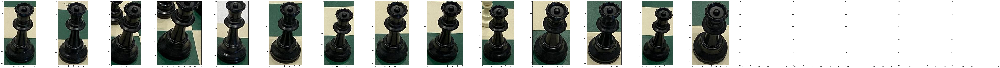

In [12]:
max_show=99

matched = amts[amts == 1]
iters = matched.index[:max_show]

cols = max([e.count(',') + 1 for e in amts[amts > 1].index])
rows = min(2, (len(matched) // cols) + 1)

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(8 * cols, 10 * rows));
ax = ax.ravel()
counter = 0
for idata, twin_code in enumerate(iters):

    tmp = bq[bq['twin_set_cluster_obj'] == twin_code]

    ifns = [str(e).zfill(5) for e in tmp.index]

    clip_fns = [[e for e in os.listdir(crop_dir) if ifn in e][0] for ifn in ifns]
    clips = [PIL.Image.open(crop_dir + fn) for fn in clip_fns]

    for pil in clips:
        ax[counter].imshow(np.array(pil))
        counter += 1
    
#     print(twin_code)
    
plt.show()

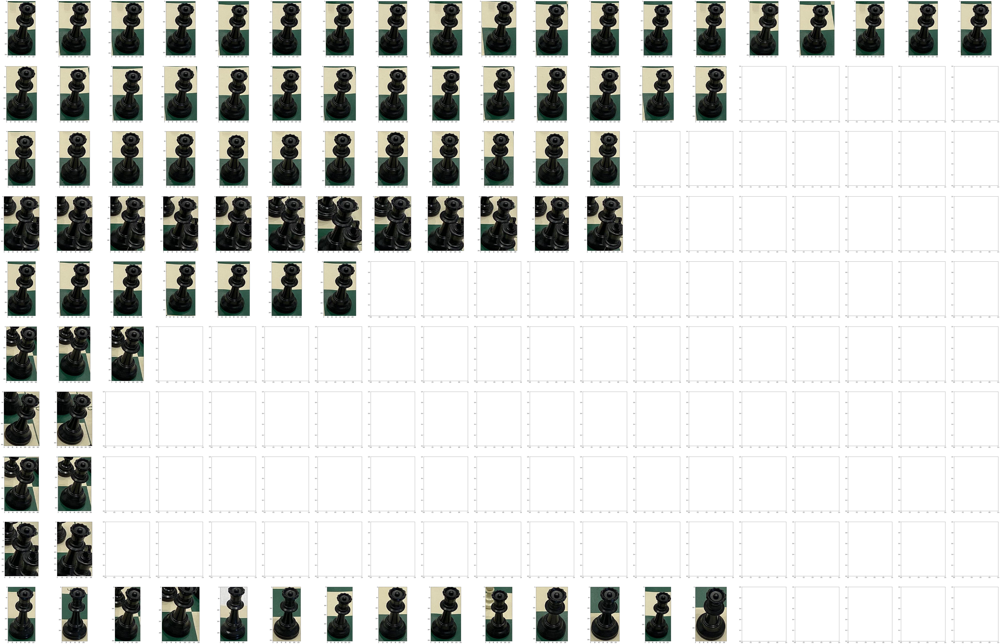

In [24]:
max_show = 99

matched = amts[amts > 1]
unmatched = amts[amts == 1]

iters = matched.sort_values(ascending=False).index[:max_show]

cols = max([e.count(',') + 1 for e in iters])
rows = len(iters) + ((len(unmatched) // cols)+1)

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(8 * cols, 10 * rows));

for irow, twin_code in enumerate(iters):

    tmp = bq[bq['twin_set_cluster_obj'] == twin_code]

    ifns = [str(e).zfill(5) for e in tmp.index]

    clip_fns = [[e for e in os.listdir(crop_dir) if ifn in e][0] for ifn in ifns]
    clips = [PIL.Image.open(crop_dir + fn) for fn in clip_fns]
    
    for icol, pil in enumerate(clips):
        ax[irow][icol].imshow(np.array(pil))

# second half fill in unqiue images -----

irow += 1
counter = 0
for idata, twin_code in enumerate(unmatched.index[:max_show]):

    tmp = bq[bq['twin_set_cluster_obj'] == twin_code]

    ifns = [str(e).zfill(5) for e in tmp.index]

    clip_fns = [[e for e in os.listdir(crop_dir) if ifn in e][0] for ifn in ifns]
    clips = [PIL.Image.open(crop_dir + fn) for fn in clip_fns]

    for pil in clips:
        counter_row = counter // cols
        counter_col = counter % cols
        ax[irow + counter_row][counter_col].imshow(np.array(pil))
        counter += 1
    
plt.show()